# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

The objective is to analyze the determinants of car pricing and consumer preferences in the used car market. Through this exploration, I aim to provide valuable insights for industry stakeholders navigating this dynamic landscape.

#### The key objective to generating high car prices is to increase profitablity to a used car dealership. This can be accomplished through several mechanisms:

- Higher prices directly increase the revenue generated from each sale, leading to higher profit margins while operational overhead costs stay constant. 
- Higher prices can create a perception of value and quality among customers, commanding premium prices for its inventory.
- Increased profitability from higher prices can enable the dealership to invest in marketing, customer service, and inventory expansion, further solidifying its competitive position in the market.

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

In [452]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from sklearn.linear_model import LinearRegression, HuberRegressor
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings('ignore')

In [454]:
vehicles = pd.read_csv('data/vehicles.csv')

In [455]:
vehicles.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


In [458]:
vehicles.describe()

,id,price,year,odometer
count,4.268800e+05,4.268800e+05,425675.000000,4.224800e+05
mean,7.311487e+09,7.519903e+04,2011.235191,9.804333e+04
std,4.473170e+06,1.218228e+07,9.452120,2.138815e+05
min,7.207408e+09,0.000000e+00,1900.000000,0.000000e+00
25%,7.308143e+09,5.900000e+03,2008.000000,3.770400e+04
50%,7.312621e+09,1.395000e+04,2013.000000,8.554800e+04
75%,7.315254e+09,2.648575e+04,2017.000000,1.335425e+05
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07


In [460]:
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [461]:
vehicles.tail()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
426875,7301591192,wyoming,23590,2019.0,nissan,maxima s sedan 4d,good,6 cylinders,gas,32226.0,clean,other,1N4AA6AV6KC367801,fwd,NaN,sedan,NaN,wy
426876,7301591187,wyoming,30590,2020.0,volvo,s60 t5 momentum sedan 4d,good,NaN,gas,12029.0,clean,other,7JR102FKXLG042696,fwd,NaN,sedan,red,wy
426877,7301591147,wyoming,34990,2020.0,cadillac,xt4 sport suv 4d,good,NaN,diesel,4174.0,clean,other,1GYFZFR46LF088296,NaN,NaN,hatchback,white,wy
426878,7301591140,wyoming,28990,2018.0,lexus,es 350 sedan 4d,good,6 cylinders,gas,30112.0,clean,other,58ABK1GG4JU103853,fwd,NaN,sedan,silver,wy
426879,7301591129,wyoming,30590,2019.0,bmw,4 series 430i gran coupe,good,NaN,gas,22716.0,clean,other,WBA4J1C58KBM14708,rwd,NaN,coupe,NaN,wy


### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [464]:
#removing salvage, rebuilt, and other title types which would be outliers or vehicles with little or no value

title_counts = vehicles['title_status'].value_counts()

# Print the counts
print(title_counts)

title_status
clean         405117
rebuilt         7219
salvage         3868
lien            1422
missing          814
parts only       198
Name: count, dtype: int64


In [466]:
#analysing the uniques values of the column "title_status" I'm determining that car dealers will only be interested in "clean" cars
# Filter rows where 'title_status' column contains 'clean' or is NaN
clean_vehicles = vehicles[vehicles['title_status'].isin(['clean'])]

In [468]:
clean_vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 405117 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            405117 non-null  int64  
 1   region        405117 non-null  object 
 2   price         405117 non-null  int64  
 3   year          404334 non-null  float64
 4   manufacturer  388690 non-null  object 
 5   model         400240 non-null  object 
 6   condition     237672 non-null  object 
 7   cylinders     232555 non-null  object 
 8   fuel          403355 non-null  object 
 9   odometer      401364 non-null  float64
 10  title_status  405117 non-null  object 
 11  transmission  403250 non-null  object 
 12  VIN           254515 non-null  object 
 13  drive         282733 non-null  object 
 14  size          114331 non-null  object 
 15  type          317548 non-null  object 
 16  paint_color   285695 non-null  object 
 17  state         405117 non-null  object 
dtypes: float

In [470]:
# I verified that 'clean_vehicles' contains only the rows where 'title_status' is 'clean' or NaN
# I assign this back to the 'vehicles' dataframe if you want to overwrite it
vehicles = clean_vehicles

In [472]:
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 405117 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            405117 non-null  int64  
 1   region        405117 non-null  object 
 2   price         405117 non-null  int64  
 3   year          404334 non-null  float64
 4   manufacturer  388690 non-null  object 
 5   model         400240 non-null  object 
 6   condition     237672 non-null  object 
 7   cylinders     232555 non-null  object 
 8   fuel          403355 non-null  object 
 9   odometer      401364 non-null  float64
 10  title_status  405117 non-null  object 
 11  transmission  403250 non-null  object 
 12  VIN           254515 non-null  object 
 13  drive         282733 non-null  object 
 14  size          114331 non-null  object 
 15  type          317548 non-null  object 
 16  paint_color   285695 non-null  object 
 17  state         405117 non-null  object 
dtypes: float

In [474]:
vehicles.tail()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
426875,7301591192,wyoming,23590,2019.0,nissan,maxima s sedan 4d,good,6 cylinders,gas,32226.0,clean,other,1N4AA6AV6KC367801,fwd,NaN,sedan,NaN,wy
426876,7301591187,wyoming,30590,2020.0,volvo,s60 t5 momentum sedan 4d,good,NaN,gas,12029.0,clean,other,7JR102FKXLG042696,fwd,NaN,sedan,red,wy
426877,7301591147,wyoming,34990,2020.0,cadillac,xt4 sport suv 4d,good,NaN,diesel,4174.0,clean,other,1GYFZFR46LF088296,NaN,NaN,hatchback,white,wy
426878,7301591140,wyoming,28990,2018.0,lexus,es 350 sedan 4d,good,6 cylinders,gas,30112.0,clean,other,58ABK1GG4JU103853,fwd,NaN,sedan,silver,wy
426879,7301591129,wyoming,30590,2019.0,bmw,4 series 430i gran coupe,good,NaN,gas,22716.0,clean,other,WBA4J1C58KBM14708,rwd,NaN,coupe,NaN,wy


In [476]:
unique_cond = vehicles['condition'].value_counts()

# Print the unique values
print(unique_cond)



condition
good         118461
excellent     91734
like new      19870
fair           6156
new            1226
salvage         225
Name: count, dtype: int64


In [478]:
# Replace NaN values in the 'condition' column with 'good'
vehicles['condition'] = vehicles['condition'].fillna('good')


In [480]:
vehicles['condition'] = vehicles['condition'].replace('NaN', 'good')

In [482]:
vehicles.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
27,7316814884,auburn,33590,2014.0,gmc,sierra 1500 crew cab slt,good,8 cylinders,gas,57923.0,clean,other,3GTP1VEC4EG551563,NaN,NaN,pickup,white,al
28,7316814758,auburn,22590,2010.0,chevrolet,silverado 1500,good,8 cylinders,gas,71229.0,clean,other,1GCSCSE06AZ123805,NaN,NaN,pickup,blue,al
29,7316814989,auburn,39590,2020.0,chevrolet,silverado 1500 crew,good,8 cylinders,gas,19160.0,clean,other,3GCPWCED5LG130317,NaN,NaN,pickup,red,al
30,7316743432,auburn,30990,2017.0,toyota,tundra double cab sr,good,8 cylinders,gas,41124.0,clean,other,5TFRM5F17HX120972,NaN,NaN,pickup,red,al
31,7316356412,auburn,15000,2013.0,ford,f-150 xlt,excellent,6 cylinders,gas,128000.0,clean,automatic,NaN,rwd,full-size,truck,black,al


In [484]:
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 405117 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            405117 non-null  int64  
 1   region        405117 non-null  object 
 2   price         405117 non-null  int64  
 3   year          404334 non-null  float64
 4   manufacturer  388690 non-null  object 
 5   model         400240 non-null  object 
 6   condition     405117 non-null  object 
 7   cylinders     232555 non-null  object 
 8   fuel          403355 non-null  object 
 9   odometer      401364 non-null  float64
 10  title_status  405117 non-null  object 
 11  transmission  403250 non-null  object 
 12  VIN           254515 non-null  object 
 13  drive         282733 non-null  object 
 14  size          114331 non-null  object 
 15  type          317548 non-null  object 
 16  paint_color   285695 non-null  object 
 17  state         405117 non-null  object 
dtypes: float

In [486]:
# Defining the values to be included in new dataset:
include_values = ["good", "excellent", "like new", "fair"]

# Filter rows where the value in the "condition" column is in the include_values list
no_salvage = vehicles[vehicles['condition'].isin(include_values)].copy()

no_salvage.info()

<class 'pandas.core.frame.DataFrame'>
Index: 403666 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            403666 non-null  int64  
 1   region        403666 non-null  object 
 2   price         403666 non-null  int64  
 3   year          402883 non-null  float64
 4   manufacturer  387384 non-null  object 
 5   model         398838 non-null  object 
 6   condition     403666 non-null  object 
 7   cylinders     231510 non-null  object 
 8   fuel          401904 non-null  object 
 9   odometer      399915 non-null  float64
 10  title_status  403666 non-null  object 
 11  transmission  401803 non-null  object 
 12  VIN           254098 non-null  object 
 13  drive         281706 non-null  object 
 14  size          113570 non-null  object 
 15  type          316603 non-null  object 
 16  paint_color   284622 non-null  object 
 17  state         403666 non-null  object 
dtypes: float

In [488]:
vehicles=no_salvage

In [490]:
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 403666 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            403666 non-null  int64  
 1   region        403666 non-null  object 
 2   price         403666 non-null  int64  
 3   year          402883 non-null  float64
 4   manufacturer  387384 non-null  object 
 5   model         398838 non-null  object 
 6   condition     403666 non-null  object 
 7   cylinders     231510 non-null  object 
 8   fuel          401904 non-null  object 
 9   odometer      399915 non-null  float64
 10  title_status  403666 non-null  object 
 11  transmission  401803 non-null  object 
 12  VIN           254098 non-null  object 
 13  drive         281706 non-null  object 
 14  size          113570 non-null  object 
 15  type          316603 non-null  object 
 16  paint_color   284622 non-null  object 
 17  state         403666 non-null  object 
dtypes: float

In [492]:
unique_cond = vehicles['condition'].value_counts()

# Print the unique values
print(unique_cond)


condition
good         285906
excellent     91734
like new      19870
fair           6156
Name: count, dtype: int64


In [494]:
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 403666 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            403666 non-null  int64  
 1   region        403666 non-null  object 
 2   price         403666 non-null  int64  
 3   year          402883 non-null  float64
 4   manufacturer  387384 non-null  object 
 5   model         398838 non-null  object 
 6   condition     403666 non-null  object 
 7   cylinders     231510 non-null  object 
 8   fuel          401904 non-null  object 
 9   odometer      399915 non-null  float64
 10  title_status  403666 non-null  object 
 11  transmission  401803 non-null  object 
 12  VIN           254098 non-null  object 
 13  drive         281706 non-null  object 
 14  size          113570 non-null  object 
 15  type          316603 non-null  object 
 16  paint_color   284622 non-null  object 
 17  state         403666 non-null  object 
dtypes: float

In [496]:
unique_cond = vehicles['drive'].value_counts()

# Print the unique values
print(unique_cond)

#Will not keep this categorical column which likely will not add much value

drive
4wd    124534
fwd    100593
rwd     56579
Name: count, dtype: int64


In [498]:
unique_color = vehicles['paint_color'].value_counts()

# Print the unique values
print(unique_color)

paint_color
white     76660
black     60523
silver    41263
blue      29849
red       29201
grey      22782
green      7008
custom     6519
brown      6321
yellow     2003
orange     1855
purple      638
Name: count, dtype: int64


In [502]:
unique_type = vehicles['type'].value_counts()


# Print the unique values
print(unique_type)

type
sedan          82099
SUV            72476
pickup         42315
truck          33081
other          21605
coupe          18213
hatchback      15815
wagon          10268
van             7787
convertible     7358
mini-van        4555
offroad          553
bus              478
Name: count, dtype: int64


In [504]:
mask = vehicles['type'] != 'other'

# Applying a boolean mask to filter rows
filtered_vehicles = vehicles[mask].copy()

# Print the filtered DataFrame to verify
unique_type = filtered_vehicles['type'].value_counts()

print(unique_type)

type
sedan          82099
SUV            72476
pickup         42315
truck          33081
coupe          18213
hatchback      15815
wagon          10268
van             7787
convertible     7358
mini-van        4555
offroad          553
bus              478
Name: count, dtype: int64


In [506]:
# Replace "pickup" with "truck" in the "type" column
vehicles['type'] = vehicles['type'].replace('pickup', 'truck')
vehicles['type'] = vehicles['type'].replace('mini-van', 'van')
vehicles['type'] = vehicles['type'].replace('wagon', 'van')
vehicles['type'] = vehicles['type'].replace('hatchback', 'coupe')

In [508]:
# identified vehicle types not likely to be sold at a used car dealership. 
#Define the values to be removed
remove_values = ["offroad", "bus", "other"]

# Filter rows where the value in the "type" column is not in the remove_values list
vehicles = vehicles[~vehicles['type'].isin(remove_values)]

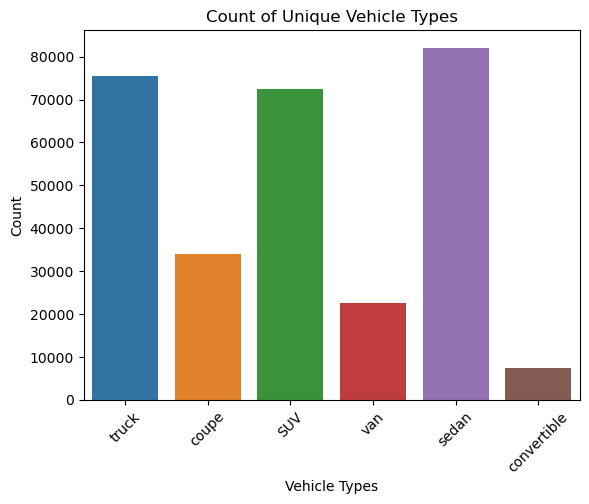

In [512]:
fig = sns.countplot(x="type", data=vehicles)

fig.set_xticklabels(fig.get_xticklabels(), rotation=45)
plt.xlabel("Vehicle Types")
plt.ylabel("Count")
plt.title("Count of Unique Vehicle Types")

plt.savefig('images/v_typesx.png')
plt.show()



In [516]:
#review of reduced list of vehicle types

unique_type = vehicles['type'].value_counts()

# Print the unique values
print(unique_type)

type
sedan          82099
truck          75396
SUV            72476
coupe          34028
van            22610
convertible     7358
Name: count, dtype: int64


In [520]:
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 381030 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            381030 non-null  int64  
 1   region        381030 non-null  object 
 2   price         381030 non-null  int64  
 3   year          380247 non-null  float64
 4   manufacturer  365805 non-null  object 
 5   model         376950 non-null  object 
 6   condition     381030 non-null  object 
 7   cylinders     221715 non-null  object 
 8   fuel          379321 non-null  object 
 9   odometer      377691 non-null  float64
 10  title_status  381030 non-null  object 
 11  transmission  379764 non-null  object 
 12  VIN           233638 non-null  object 
 13  drive         270400 non-null  object 
 14  size          111324 non-null  object 
 15  type          293967 non-null  object 
 16  paint_color   266781 non-null  object 
 17  state         381030 non-null  object 
dtypes: float

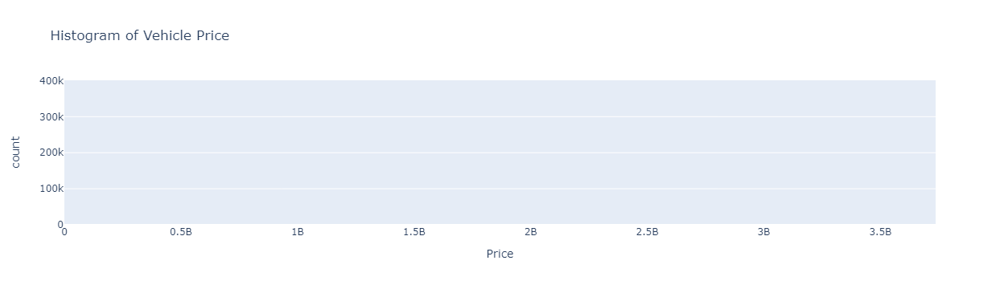

In [522]:
#plot histogram of vehicle price

fig4 = px.histogram(vehicles,x="price",title="Histogram of Vehicle Price",labels={"price": "Price"},color_discrete_sequence = px.colors.qualitative.Set1 )
fig4.write_image('images/v_pricexx.png')
fig4.show()

In [525]:
unique_trans = vehicles['transmission'].value_counts()

# Print the unique values
print(unique_trans)
#output shows that transmission is irrelevant, most are auto and too many are unspecified as "other"

transmission
automatic    306628
other         50890
manual        22246
Name: count, dtype: int64


In [527]:
cylinder_counts = vehicles['cylinders'].value_counts()

# Print the counts
print(cylinder_counts)


cylinders
6 cylinders     82420
4 cylinders     68968
8 cylinders     65845
5 cylinders      1587
10 cylinders     1293
other             885
3 cylinders       535
12 cylinders      182
Name: count, dtype: int64


In [529]:
fuel_counts = vehicles['fuel'].value_counts()

# Print the counts
print(fuel_counts)




fuel
gas         320500
diesel       27264
other        25350
hybrid        4626
electric      1581
Name: count, dtype: int64


In [531]:
vehicles['fuel'] = vehicles['fuel'].fillna('other')

# Print the unique values to verify
unique_fuel = vehicles['fuel'].unique()
print(unique_fuel)

['gas' 'other' 'diesel' 'hybrid' 'electric']


In [533]:
size_counts = vehicles['size'].value_counts()

# Print the counts
print(size_counts)

size
full-size      58863
mid-size       32046
compact        17416
sub-compact     2999
Name: count, dtype: int64


In [535]:
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 381030 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            381030 non-null  int64  
 1   region        381030 non-null  object 
 2   price         381030 non-null  int64  
 3   year          380247 non-null  float64
 4   manufacturer  365805 non-null  object 
 5   model         376950 non-null  object 
 6   condition     381030 non-null  object 
 7   cylinders     221715 non-null  object 
 8   fuel          381030 non-null  object 
 9   odometer      377691 non-null  float64
 10  title_status  381030 non-null  object 
 11  transmission  379764 non-null  object 
 12  VIN           233638 non-null  object 
 13  drive         270400 non-null  object 
 14  size          111324 non-null  object 
 15  type          293967 non-null  object 
 16  paint_color   266781 non-null  object 
 17  state         381030 non-null  object 
dtypes: float

In [537]:
vehicles_cleaned = vehicles.dropna(subset=['odometer', 'type', 'model', 'year']).copy()
#dropping null values in selected columns


In [539]:
vehicles_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 288290 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            288290 non-null  int64  
 1   region        288290 non-null  object 
 2   price         288290 non-null  int64  
 3   year          288290 non-null  float64
 4   manufacturer  279680 non-null  object 
 5   model         288290 non-null  object 
 6   condition     288290 non-null  object 
 7   cylinders     192813 non-null  object 
 8   fuel          288290 non-null  object 
 9   odometer      288290 non-null  float64
 10  title_status  288290 non-null  object 
 11  transmission  287083 non-null  object 
 12  VIN           204114 non-null  object 
 13  drive         235331 non-null  object 
 14  size          105923 non-null  object 
 15  type          288290 non-null  object 
 16  paint_color   237467 non-null  object 
 17  state         288290 non-null  object 
dtypes: float

In [541]:
vehicles=vehicles_cleaned

In [543]:
#removing price outliers
mask = (vehicles['price'] >= 4000) & (vehicles['price'] <= 150000)

# Apply the boolean mask to filter rows
filtered_price = vehicles[mask].copy()


In [545]:
filtered_price.info()

<class 'pandas.core.frame.DataFrame'>
Index: 240402 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            240402 non-null  int64  
 1   region        240402 non-null  object 
 2   price         240402 non-null  int64  
 3   year          240402 non-null  float64
 4   manufacturer  233282 non-null  object 
 5   model         240402 non-null  object 
 6   condition     240402 non-null  object 
 7   cylinders     157753 non-null  object 
 8   fuel          240402 non-null  object 
 9   odometer      240402 non-null  float64
 10  title_status  240402 non-null  object 
 11  transmission  239381 non-null  object 
 12  VIN           175120 non-null  object 
 13  drive         194710 non-null  object 
 14  size          82639 non-null   object 
 15  type          240402 non-null  object 
 16  paint_color   201749 non-null  object 
 17  state         240402 non-null  object 
dtypes: float

In [547]:
#I'm happy with the results so I'm saving
vehicles=filtered_price

In [549]:
#removing odometer outliers
mask2 = (vehicles['odometer'] >= 1000) & (vehicles['odometer'] <= 300000)

# Apply the boolean mask to filter rows
filtered_price = vehicles[mask2].copy()

In [551]:
filtered_price.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236827 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            236827 non-null  int64  
 1   region        236827 non-null  object 
 2   price         236827 non-null  int64  
 3   year          236827 non-null  float64
 4   manufacturer  230121 non-null  object 
 5   model         236827 non-null  object 
 6   condition     236827 non-null  object 
 7   cylinders     155131 non-null  object 
 8   fuel          236827 non-null  object 
 9   odometer      236827 non-null  float64
 10  title_status  236827 non-null  object 
 11  transmission  235820 non-null  object 
 12  VIN           173199 non-null  object 
 13  drive         191849 non-null  object 
 14  size          81312 non-null   object 
 15  type          236827 non-null  object 
 16  paint_color   198716 non-null  object 
 17  state         236827 non-null  object 
dtypes: float

In [553]:
#I'm happy with the results so I'm saving
vehicles=filtered_price

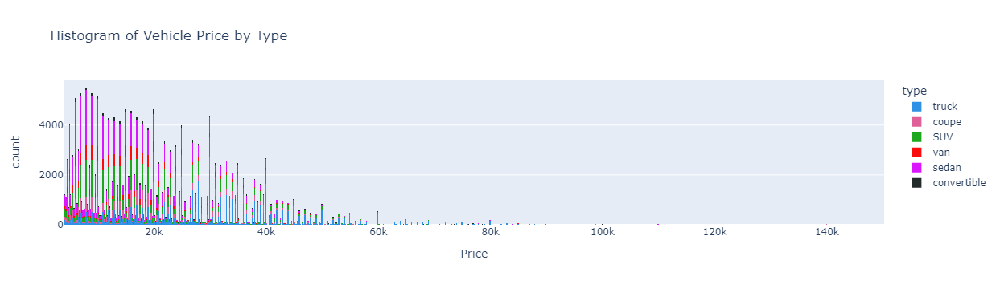

In [555]:
fig2 = px.histogram(vehicles, x="price",title="Histogram of Vehicle Price by Type",labels={"price": "Price"},color_discrete_sequence = px.colors.qualitative.Dark24, color = "type" )
fig2.write_image('images/type_price2.png')
fig2.show()

In [557]:
vehicles.describe()
rounded_description = filtered_price.describe().round()

# Print the rounded description
print(rounded_description)

                 id     price      year  odometer
count  2.368270e+05  236827.0  236827.0  236827.0
mean   7.311286e+09   21261.0    2012.0   84848.0
std    4.428523e+06   13969.0       8.0   57061.0
min    7.301583e+09    4000.0    1918.0    1000.0
25%    7.307795e+09    9995.0    2010.0   35072.0
50%    7.312202e+09   17999.0    2014.0   79000.0
75%    7.315108e+09   29500.0    2017.0  124000.0
max    7.317101e+09  150000.0    2022.0  300000.0


In [559]:
vehicles_copy=vehicles
vehicles_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236827 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            236827 non-null  int64  
 1   region        236827 non-null  object 
 2   price         236827 non-null  int64  
 3   year          236827 non-null  float64
 4   manufacturer  230121 non-null  object 
 5   model         236827 non-null  object 
 6   condition     236827 non-null  object 
 7   cylinders     155131 non-null  object 
 8   fuel          236827 non-null  object 
 9   odometer      236827 non-null  float64
 10  title_status  236827 non-null  object 
 11  transmission  235820 non-null  object 
 12  VIN           173199 non-null  object 
 13  drive         191849 non-null  object 
 14  size          81312 non-null   object 
 15  type          236827 non-null  object 
 16  paint_color   198716 non-null  object 
 17  state         236827 non-null  object 
dtypes: float

In [ ]:
# List of columns to keep in the new DataFrame
#columns_to_keep = ['price', 'year', 'condition', 'odometer','type']

# Create a new DataFrame with only the specified columns
#new_vehicles= vehicles[columns_to_keep].copy()
#removed VIN and drive and size and others


In [561]:

keep_top_features = ['price', 'odometer', 'year', 'condition','type']

# Create a new DataFrame with only the specified columns
prep_vehicles= vehicles_copy[keep_top_features].copy()
prep_vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236827 entries, 27 to 426879
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   price      236827 non-null  int64  
 1   odometer   236827 non-null  float64
 2   year       236827 non-null  float64
 3   condition  236827 non-null  object 
 4   type       236827 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 10.8+ MB


In [563]:
prep_vehicles.head()

,price,odometer,year,condition,type
27,33590,57923.0,2014.0,good,truck
28,22590,71229.0,2010.0,good,truck
29,39590,19160.0,2020.0,good,truck
30,30990,41124.0,2017.0,good,truck
31,15000,128000.0,2013.0,excellent,truck


In [565]:
prep_vehicles.describe().round()

,price,odometer,year
count,236827.0,236827.0,236827.0
mean,21261.0,84848.0,2012.0
std,13969.0,57061.0,8.0
min,4000.0,1000.0,1918.0
25%,9995.0,35072.0,2010.0
50%,17999.0,79000.0,2014.0
75%,29500.0,124000.0,2017.0
max,150000.0,300000.0,2022.0


(array([166.,  19.,  11., ...,   0.,   0.,  45.]),
 array([  1000. ,   1029.9,   1059.8, ..., 299940.2, 299970.1, 300000. ]),
 <BarContainer object of 10000 artists>)

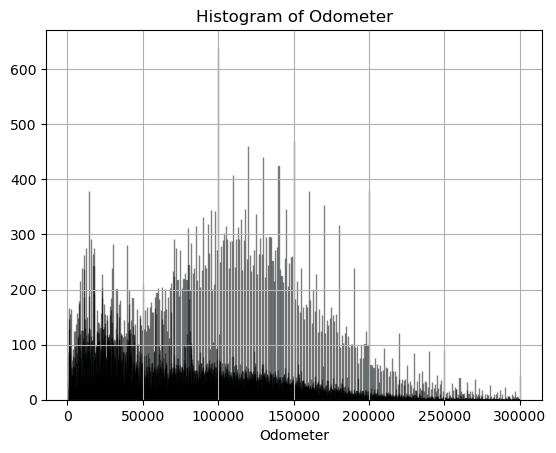

In [569]:
plt.title('Histogram of Odometer')
plt.xlabel('Odometer')
plt.grid()
plt.hist(prep_vehicles['odometer'], bins=10000, edgecolor='black', alpha=0.5, color='lightblue')


In [ ]:
plt.title('Histogram of year')
plt.xlabel('year')
plt.grid()
plt.hist(prep_vehicles['year'], bins=10000, edgecolor='black', alpha=0.5, color='lightblue')

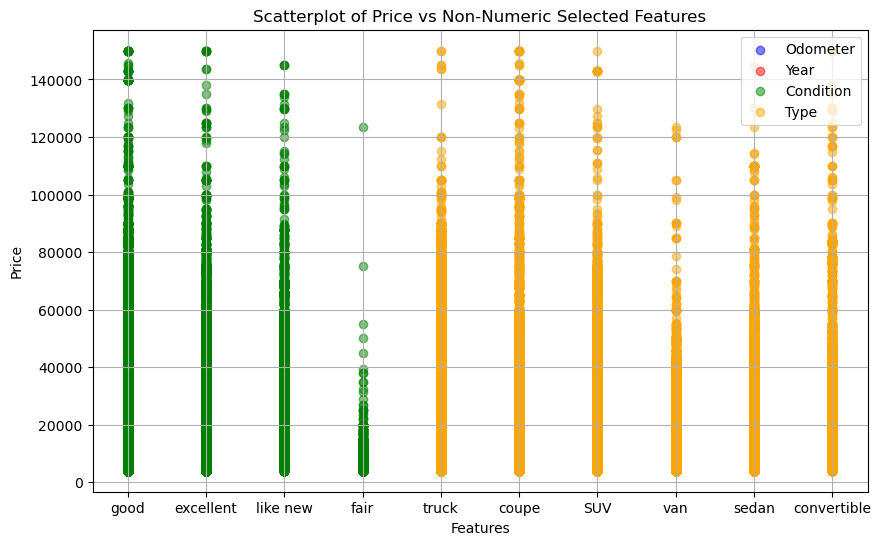

In [571]:
import matplotlib.pyplot as plt

# Extracting selected features
price = prep_vehicles['price']
odometer = prep_vehicles['odometer']
year = prep_vehicles['year']
condition = prep_vehicles['condition']
car_type = prep_vehicles['type']

# Creating scatterplot
plt.figure(figsize=(10, 6))
plt.scatter(odometer, price, color='blue', alpha=0.5, label='Odometer')
plt.scatter(year, price, color='red', alpha=0.5, label='Year')
plt.scatter(condition, price, color='green', alpha=0.5, label='Condition')
plt.scatter(car_type, price, color='orange', alpha=0.5, label='Type')

# Adding labels and title
plt.xlabel('Features')
plt.ylabel('Price')
plt.title('Scatterplot of Price vs Non-Numeric Selected Features')
plt.legend()
plt.grid(True)
plt.show()

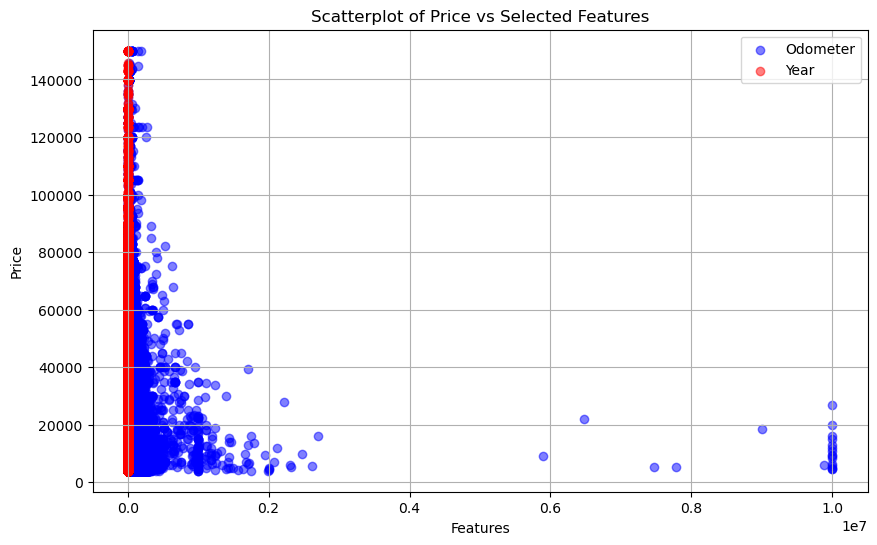

In [133]:
# Extracting selected features
price = prep_vehicles['price']
odometer = prep_vehicles['odometer']
year = prep_vehicles['year']


# Creating scatterplot
plt.figure(figsize=(10, 6))
plt.scatter(odometer, price, color='blue', alpha=0.5, label='Odometer')
plt.scatter(year, price, color='red', alpha=0.5, label='Year')


# Adding labels and title
plt.xlabel('Features')
plt.ylabel('Price')
plt.title('Scatterplot of Price vs Selected Features')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
**************************************************

In [596]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(sparse_output=False)
encoded_df=pd.get_dummies(prep_vehicles, dtype=int, columns=['condition', 'type'])
encoded_df=encoded_df.drop(columns=['price', 'year','odometer'])

df=pd.concat([prep_vehicles, encoded_df], axis=1)
df.head()

,price,odometer,year,condition,type,condition_excellent,condition_fair,condition_good,condition_like new,type_SUV,type_convertible,type_coupe,type_sedan,type_truck,type_van
27,33590,57923.0,2014.0,good,truck,0,0,1,0,0,0,0,0,1,0
28,22590,71229.0,2010.0,good,truck,0,0,1,0,0,0,0,0,1,0
29,39590,19160.0,2020.0,good,truck,0,0,1,0,0,0,0,0,1,0
30,30990,41124.0,2017.0,good,truck,0,0,1,0,0,0,0,0,1,0
31,15000,128000.0,2013.0,excellent,truck,1,0,0,0,0,0,0,0,1,0


In [ ]:
X.info()

In [613]:
import pandas as pd
import pandas as pd
from sklearn.preprocessing import OneHotEncoder 
from sklearn.model_selection import train_test_split



In [615]:
#keeping top numeric features
keep_num_features = ['price', 'odometer', 'year']

# Create a new DataFrame with only the specified columns
top_vehicles= vehicles_copy[keep_num_features].copy()
top_vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236827 entries, 27 to 426879
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   price     236827 non-null  int64  
 1   odometer  236827 non-null  float64
 2   year      236827 non-null  float64
dtypes: float64(2), int64(1)
memory usage: 7.2 MB


In [638]:
#Compare the coefficients of the model.
X = pd.get_dummies(vehicles_copy[['condition']])
y = vehicles_copy['price']
cond_linreg = LinearRegression(fit_intercept=False).fit(X, y)
best_cond_prediction = float(round(cond_linreg.coef_[0], 2))
### END SOLUTION

# Answer check
print(best_cond_prediction)
print(type(best_cond_prediction))

16467.49
<class 'float'>


In [640]:
#apply one-hot-encoding on "type"
X = pd.get_dummies(vehicles_copy[['type']])
y = vehicles_copy['price']
type_linreg = LinearRegression(fit_intercept=False).fit(X, y)

print(type_linreg.coef_)
print(type_linreg)
print(type(type_linreg))
type_linreg.coef_

[19354.85251767 21903.83980274 20786.85754268 16325.36482828
 29614.42504589 16247.83499749]
LinearRegression(fit_intercept=False)
<class 'sklearn.linear_model._base.LinearRegression'>


array([19354.85251767, 21903.83980274, 20786.85754268, 16325.36482828,
       29614.42504589, 16247.83499749])

In [642]:
#Examine the coefficients from the model and use them to determine the predicted price

vehicles_encoded = pd.get_dummies(vehicles_copy[['condition', 'type']])

vehicle_features = pd.DataFrame({
    'condition': ['excellent'],
    'type': ['truck']
})

vehicle_features_encoded = pd.get_dummies(vehicle_features).reindex(columns=vehicles_encoded.columns, fill_value=0)

ct_linreg = LinearRegression(fit_intercept=False).fit(vehicles_encoded, vehicles_copy['price'])

ct_prediction = ct_linreg.predict(vehicle_features_encoded)

ct_prediction = round(ct_prediction[0], 2)

coefs_ = ct_linreg.coef_
coefs = ct_linreg.coef_

# Check if the coefficients match between the two models
assert np.array_equal(coefs, coefs_), "Coefficients do not match"
assert np.isclose(ct_prediction, ct_prediction), "Pridiction values do not match"




print(ct_prediction)
print(type(ct_prediction))
print("Test case passed!")



25068.8
<class 'numpy.float64'>
Test case passed!


In [644]:
#repeated for different car qualities to find predicted Price

#built a model that contains all features to predict price using dummy encode all of the features in the data. 
#Determine the mean_squared_error of predictions. Using the LinearRegression estimator and the mean_squared_error function from sklearn. 

X = pd.get_dummies(vehicles_copy.drop('price', axis = 1))
y = vehicles_copy['price']
all_features_linreg = LinearRegression(fit_intercept=False).fit(X, y)
linreg_mse = mean_squared_error(all_features_linreg.predict(X), y)

print(all_features_linreg)
print(all_features_linreg.coef_)
print(linreg_mse)


MemoryError: Unable to allocate 16.0 GiB for an array with shape (72615, 236827) and data type bool

In [646]:
X.head()

,type_SUV,type_convertible,type_coupe,type_sedan,type_truck,type_van
27,False,False,False,False,True,False
28,False,False,False,False,True,False
29,False,False,False,False,True,False
30,False,False,False,False,True,False
31,False,False,False,False,True,False


In [648]:
encoder = OneHotEncoder(sparse_output=False)
encoded_df=pd.get_dummies(vehicles, dtype=int, columns=['condition', 'type'])
encoded_df=encoded_df.drop(columns=['price', 'year','odometer'])

df=pd.concat([vehicles, encoded_df], axis=1)
df.head()
                

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,...,condition_excellent,condition_fair,condition_good,condition_like new,type_SUV,type_convertible,type_coupe,type_sedan,type_truck,type_van
27,7316814884,auburn,33590,2014.0,gmc,sierra 1500 crew cab slt,good,8 cylinders,gas,57923.0,...,0,0,1,0,0,0,0,0,1,0
28,7316814758,auburn,22590,2010.0,chevrolet,silverado 1500,good,8 cylinders,gas,71229.0,...,0,0,1,0,0,0,0,0,1,0
29,7316814989,auburn,39590,2020.0,chevrolet,silverado 1500 crew,good,8 cylinders,gas,19160.0,...,0,0,1,0,0,0,0,0,1,0
30,7316743432,auburn,30990,2017.0,toyota,tundra double cab sr,good,8 cylinders,gas,41124.0,...,0,0,1,0,0,0,0,0,1,0
31,7316356412,auburn,15000,2013.0,ford,f-150 xlt,excellent,6 cylinders,gas,128000.0,...,1,0,0,0,0,0,0,0,1,0


In [657]:

y=df['price']
X=df.drop(['id','price', 'region', 'manufacturer', 'cylinders','type','condition', 'fuel','title_status','transmission', 'model','VIN','drive','size','paint_color','state'], axis = 1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [659]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236827 entries, 27 to 426879
Data columns (total 12 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   year                 236827 non-null  float64
 1   odometer             236827 non-null  float64
 2   condition_excellent  236827 non-null  int32  
 3   condition_fair       236827 non-null  int32  
 4   condition_good       236827 non-null  int32  
 5   condition_like new   236827 non-null  int32  
 6   type_SUV             236827 non-null  int32  
 7   type_convertible     236827 non-null  int32  
 8   type_coupe           236827 non-null  int32  
 9   type_sedan           236827 non-null  int32  
 10  type_truck           236827 non-null  int32  
 11  type_van             236827 non-null  int32  
dtypes: float64(2), int32(10)
memory usage: 14.5 MB


In [661]:
X.describe()

,year,odometer,condition_excellent,condition_fair,condition_good,condition_like new,type_SUV,type_convertible,type_coupe,type_sedan,type_truck,type_van
count,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000
mean,2012.463739,84848.265109,0.261761,0.005464,0.680383,0.052393,0.244275,0.026543,0.120696,0.268272,0.264518,0.075697
std,7.873978,57060.588868,0.439594,0.073716,0.466329,0.222818,0.429658,0.160743,0.325774,0.443061,0.441077,0.264513
min,1918.000000,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2010.000000,35072.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2014.000000,79000.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2017.000000,124000.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,2022.000000,300000.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [663]:
int_select=df.drop(['id', 'region', 'manufacturer', 'cylinders','type','condition', 'fuel','title_status','transmission', 'model','VIN','drive','size','paint_color','state'], axis = 1)

In [665]:
int_vehicles=int_select

In [667]:
int_vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236827 entries, 27 to 426879
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   price                236827 non-null  int64  
 1   year                 236827 non-null  float64
 2   odometer             236827 non-null  float64
 3   condition_excellent  236827 non-null  int32  
 4   condition_fair       236827 non-null  int32  
 5   condition_good       236827 non-null  int32  
 6   condition_like new   236827 non-null  int32  
 7   type_SUV             236827 non-null  int32  
 8   type_convertible     236827 non-null  int32  
 9   type_coupe           236827 non-null  int32  
 10  type_sedan           236827 non-null  int32  
 11  type_truck           236827 non-null  int32  
 12  type_van             236827 non-null  int32  
dtypes: float64(2), int32(10), int64(1)
memory usage: 16.3 MB


In [669]:
int_vehicles['year'] = int_vehicles['year'].astype(int)
int_vehicles['odometer'] = int_vehicles['odometer'].astype(int)
int_vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236827 entries, 27 to 426879
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype
---  ------               --------------   -----
 0   price                236827 non-null  int64
 1   year                 236827 non-null  int32
 2   odometer             236827 non-null  int32
 3   condition_excellent  236827 non-null  int32
 4   condition_fair       236827 non-null  int32
 5   condition_good       236827 non-null  int32
 6   condition_like new   236827 non-null  int32
 7   type_SUV             236827 non-null  int32
 8   type_convertible     236827 non-null  int32
 9   type_coupe           236827 non-null  int32
 10  type_sedan           236827 non-null  int32
 11  type_truck           236827 non-null  int32
 12  type_van             236827 non-null  int32
dtypes: int32(12), int64(1)
memory usage: 14.5 MB


In [671]:
# If needed, drop non-numeric columns or handle them separately
#numeric_columns =int_vehicles.select_dtypes(include=['number'])

# Calculate the correlation matrix
correlation_matrix = int_vehicles.corr()

# Print or display the correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

Correlation Matrix:
                        price      year  odometer  condition_excellent  \
price                1.000000  0.365114 -0.529614            -0.204342   
year                 0.365114  1.000000 -0.381087            -0.174746   
odometer            -0.529614 -0.381087  1.000000             0.228193   
condition_excellent -0.204342 -0.174746  0.228193             1.000000   
condition_fair      -0.072755 -0.145952  0.085532            -0.044136   
condition_good       0.206940  0.198507 -0.222952            -0.868791   
condition_like new  -0.005886 -0.022409 -0.011886            -0.140015   
type_SUV            -0.077589  0.035621  0.100358             0.063444   
type_convertible     0.007596 -0.189150 -0.052134             0.032363   
type_coupe          -0.012582 -0.035947 -0.163150            -0.043053   
type_sedan          -0.213946  0.056866 -0.069555             0.016700   
type_truck           0.358606 -0.001442  0.077243            -0.057841   
type_van          

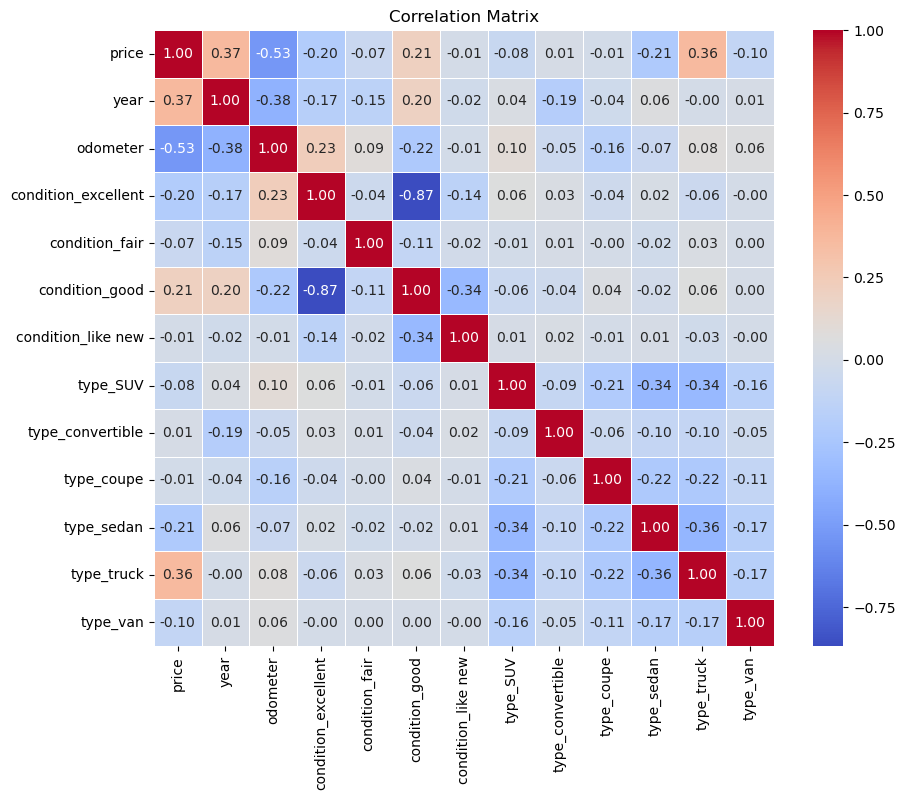

In [673]:
import seaborn as sns
import matplotlib.pyplot as plt

numeric_columns = int_vehicles
# Calculate the correlation matrix
correlation_matrix = numeric_columns.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')

plt.savefig('images/corr_matrix2.png')
plt.show()



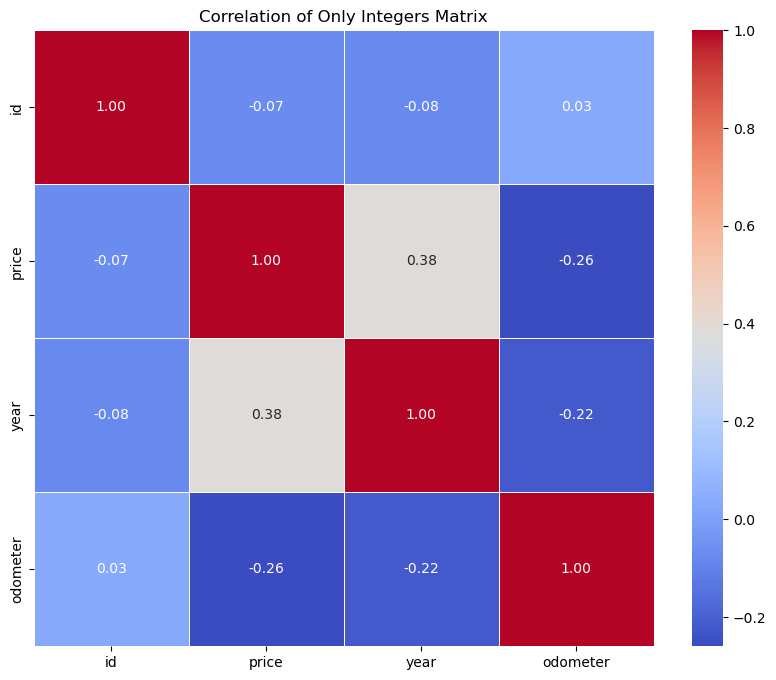

In [465]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'vehicles' is your DataFrame
# If needed, drop non-numeric columns or handle them separately
numeric_columns = vehicles.select_dtypes(include=['number'])

# Calculate the correlation matrix
correlation_matrix = numeric_columns.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation of Only Integers Matrix')
plt.savefig('images/corr_intonly.png')
plt.show()



In [ ]:
#PCA after standardization, all atributes centers around 0 with a standard deviation of 1
#Will minimize the error - MSE



In [675]:
vehicles_scaled = (int_vehicles - int_vehicles.mean())/int_vehicles.std()

print(vehicles_scaled.shape)
print(type(vehicles_scaled))

(236827, 13)
<class 'pandas.core.frame.DataFrame'>


In [677]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
import warnings

from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn import set_config
set_config(display="diagram")



In [681]:
#Apply scaling to compare outcomes, models and predictions
vehicles_scaled.head()

,price,year,odometer,condition_excellent,condition_fair,condition_good,condition_like new,type_SUV,type_convertible,type_coupe,type_sedan,type_truck,type_van
27,0.882557,0.195106,-0.471871,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174
28,0.095118,-0.312896,-0.238681,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174
29,1.312069,0.957110,-1.151202,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174
30,0.696435,0.576108,-0.766278,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174
31,-0.448216,0.068105,0.756244,1.679366,-0.074121,-1.459018,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174


In [683]:
int_vehicles.head()

,price,year,odometer,condition_excellent,condition_fair,condition_good,condition_like new,type_SUV,type_convertible,type_coupe,type_sedan,type_truck,type_van
27,33590,2014,57923,0,0,1,0,0,0,0,0,1,0
28,22590,2010,71229,0,0,1,0,0,0,0,0,1,0
29,39590,2020,19160,0,0,1,0,0,0,0,0,1,0
30,30990,2017,41124,0,0,1,0,0,0,0,0,1,0
31,15000,2013,128000,1,0,0,0,0,0,0,0,1,0


In [685]:
pca = PCA(n_components=3, random_state=42)

print(pca)
print(pca.n_components)

PCA(n_components=3, random_state=42)
3


In [687]:
pca = PCA(n_components=3, random_state = 42)
components = pca.fit_transform(vehicles_scaled)

print(type(components))
print(components.shape)

<class 'numpy.ndarray'>
(236827, 3)


In [689]:
kmeans = KMeans(n_clusters=3, random_state=42).fit(components)

df_clustered = vehicles_scaled
df_clustered['cluster'] = kmeans.labels_

print(type(df_clustered))
print(df_clustered.shape)

<class 'pandas.core.frame.DataFrame'>
(236827, 14)


In [691]:
# Get centroids of the clusters
centroids = kmeans.cluster_centers_

# Assuming your feature names are stored in a list named `feature_names`
feature_names = vehicles_scaled.columns.tolist()

# Create a dictionary to store the top features for each cluster
top_features_by_cluster = {}

# Iterate through each cluster
for cluster_id in range(kmeans.n_clusters):
    # Get the centroid for the current cluster
    centroid = centroids[cluster_id]
    
    # Sort the indices of the centroid to get top features
    top_feature_indices = centroid.argsort()[::-1]
    
    # Get top feature names
    top_feature_names = [feature_names[i] for i in top_feature_indices]
    
    # Store top features for the current cluster
    top_features_by_cluster[cluster_id] = top_feature_names

# Print top features for each cluster
for cluster_id, top_features in top_features_by_cluster.items():
    print(f"Cluster {cluster_id} top features: {top_features}")

Cluster 0 top features: ['year', 'odometer', 'price']
Cluster 1 top features: ['odometer', 'price', 'year']
Cluster 2 top features: ['price', 'year', 'odometer']


In [327]:
vehicles_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 255867 entries, 27 to 426879
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   year                 255867 non-null  float64
 1   odometer             255867 non-null  float64
 2   condition_excellent  255867 non-null  float64
 3   condition_fair       255867 non-null  float64
 4   condition_good       255867 non-null  float64
 5   condition_like new   255867 non-null  float64
 6   type_SUV             255867 non-null  float64
 7   type_convertible     255867 non-null  float64
 8   type_coupe           255867 non-null  float64
 9   type_sedan           255867 non-null  float64
 10  type_truck           255867 non-null  float64
 11  type_van             255867 non-null  float64
 12  cluster              255867 non-null  int32  
dtypes: float64(12), int32(1)
memory usage: 26.4 MB


In [693]:
vehicles_scaled.head()

,price,year,odometer,condition_excellent,condition_fair,condition_good,condition_like new,type_SUV,type_convertible,type_coupe,type_sedan,type_truck,type_van,cluster
27,0.882557,0.195106,-0.471871,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,0
28,0.095118,-0.312896,-0.238681,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,0
29,1.312069,0.957110,-1.151202,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,0
30,0.696435,0.576108,-0.766278,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,0
31,-0.448216,0.068105,0.756244,1.679366,-0.074121,-1.459018,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,2


In [695]:
vehicles_scaled.describe()

,price,year,odometer,condition_excellent,condition_fair,condition_good,condition_like new,type_SUV,type_convertible,type_coupe,type_sedan,type_truck,type_van,cluster
count,2.368270e+05,2.368270e+05,2.368270e+05,2.368270e+05,2.368270e+05,2.368270e+05,2.368270e+05,2.368270e+05,2.368270e+05,2.368270e+05,2.368270e+05,2.368270e+05,2.368270e+05,236827.000000
mean,1.178502e-16,-1.374647e-14,-7.476650e-17,2.880250e-17,2.304200e-17,-8.832767e-17,-3.408296e-17,-4.332376e-17,2.256196e-17,-6.870597e-17,-8.496738e-17,4.704409e-17,2.736238e-17,0.905425
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.835275
min,-1.235655e+00,-1.199695e+01,-1.469460e+00,-5.954602e-01,-7.412084e-02,-1.459018e+00,-2.351366e-01,-5.685349e-01,-1.651248e-01,-3.704891e-01,-6.054965e-01,-5.997091e-01,-2.861739e-01,0.000000
25%,-8.065004e-01,-3.128964e-01,-8.723405e-01,-5.954602e-01,-7.412084e-02,-1.459018e+00,-2.351366e-01,-5.685349e-01,-1.651248e-01,-3.704891e-01,-6.054965e-01,-5.997091e-01,-2.861739e-01,0.000000
50%,-2.335309e-01,1.951060e-01,-1.024922e-01,-5.954602e-01,-7.412084e-02,6.853897e-01,-2.351366e-01,-5.685349e-01,-1.651248e-01,-3.704891e-01,-6.054965e-01,-5.997091e-01,-2.861739e-01,1.000000
75%,5.897726e-01,5.761078e-01,6.861432e-01,1.679366e+00,-7.412084e-02,6.853897e-01,-2.351366e-01,-5.685349e-01,-1.651248e-01,-3.704891e-01,1.651530e+00,1.667468e+00,-2.861739e-01,2.000000
max,9.215812e+00,1.211111e+00,3.770584e+00,1.679366e+00,1.349143e+01,6.853897e-01,4.252830e+00,1.758900e+00,6.056002e+00,2.699124e+00,1.651530e+00,1.667468e+00,3.494364e+00,2.000000


In [697]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error



In [699]:
top1_features = LinearRegression(fit_intercept=False).fit(int_vehicles[['year']], vehicles['price'])


In [701]:
top2_features = LinearRegression(fit_intercept=False).fit(int_vehicles[['year', 'odometer']], vehicles['price'])

In [703]:
top3_features = LinearRegression(fit_intercept=False).fit(int_vehicles[['year', 'odometer', 'condition_good']], vehicles['price'])
print(top3_features)

LinearRegression(fit_intercept=False)


In [705]:
pred1 = top1_features.predict(int_vehicles[['year']])
pred2 = top2_features.predict(int_vehicles[['year', 'odometer']])
pred3 = top3_features.predict(int_vehicles[['year', 'odometer', 'condition_good']])
error_dict = {'Features': ['1 Feature', '2 Features', '3 Features'],
'MSE': [mean_squared_error(vehicles['price'], i) for i in [pred1, pred2, pred3]],
'MAE': [mean_absolute_error(vehicles['price'], i) for i in [pred1, pred2, pred3]]}
mse_df = pd.DataFrame(error_dict).set_index('Features')

mse_df

,MSE,MAE
Features,,
1 Feature,1.942994e+08,10881.453849
2 Features,1.398446e+08,8697.603515
3 Features,1.382968e+08,8609.716087


## Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [707]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_squared_error
from sklearn import set_config


from sklearn.linear_model import LinearRegression, Lasso
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.feature_selection import SequentialFeatureSelector, SelectFromModel
from sklearn.model_selection import train_test_split, GridSearchCV

set_config(display="diagram")

import plotly.express as px

In [722]:
  #putting it all together
vehicles_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236827 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            236827 non-null  int64  
 1   region        236827 non-null  object 
 2   price         236827 non-null  int64  
 3   year          236827 non-null  float64
 4   manufacturer  230121 non-null  object 
 5   model         236827 non-null  object 
 6   condition     236827 non-null  object 
 7   cylinders     155131 non-null  object 
 8   fuel          236827 non-null  object 
 9   odometer      236827 non-null  float64
 10  title_status  236827 non-null  object 
 11  transmission  235820 non-null  object 
 12  VIN           173199 non-null  object 
 13  drive         191849 non-null  object 
 14  size          81312 non-null   object 
 15  type          236827 non-null  object 
 16  paint_color   198716 non-null  object 
 17  state         236827 non-null  object 
dtypes: float

In [727]:
int_vehicles.head()

,price,year,odometer,condition_excellent,condition_fair,condition_good,condition_like new,type_SUV,type_convertible,type_coupe,type_sedan,type_truck,type_van
27,33590,2014,57923,0,0,1,0,0,0,0,0,1,0
28,22590,2010,71229,0,0,1,0,0,0,0,0,1,0
29,39590,2020,19160,0,0,1,0,0,0,0,0,1,0
30,30990,2017,41124,0,0,1,0,0,0,0,0,1,0
31,15000,2013,128000,1,0,0,0,0,0,0,0,1,0


In [729]:
cars=int_vehicles
cars.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236827 entries, 27 to 426879
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype
---  ------               --------------   -----
 0   price                236827 non-null  int64
 1   year                 236827 non-null  int32
 2   odometer             236827 non-null  int32
 3   condition_excellent  236827 non-null  int32
 4   condition_fair       236827 non-null  int32
 5   condition_good       236827 non-null  int32
 6   condition_like new   236827 non-null  int32
 7   type_SUV             236827 non-null  int32
 8   type_convertible     236827 non-null  int32
 9   type_coupe           236827 non-null  int32
 10  type_sedan           236827 non-null  int32
 11  type_truck           236827 non-null  int32
 12  type_van             236827 non-null  int32
dtypes: int32(12), int64(1)
memory usage: 14.5 MB


In [731]:
cars.describe()

,price,year,odometer,condition_excellent,condition_fair,condition_good,condition_like new,type_SUV,type_convertible,type_coupe,type_sedan,type_truck,type_van
count,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000,236827.000000
mean,21261.270759,2012.463739,84848.265109,0.261761,0.005464,0.680383,0.052393,0.244275,0.026543,0.120696,0.268272,0.264518,0.075697
std,13969.331045,7.873978,57060.588868,0.439594,0.073716,0.466329,0.222818,0.429658,0.160743,0.325774,0.443061,0.441077,0.264513
min,4000.000000,1918.000000,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9995.000000,2010.000000,35072.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,17999.000000,2014.000000,79000.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,29500.000000,2017.000000,124000.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,150000.000000,2022.000000,300000.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [733]:
cars.head()

,price,year,odometer,condition_excellent,condition_fair,condition_good,condition_like new,type_SUV,type_convertible,type_coupe,type_sedan,type_truck,type_van
27,33590,2014,57923,0,0,1,0,0,0,0,0,1,0
28,22590,2010,71229,0,0,1,0,0,0,0,0,1,0
29,39590,2020,19160,0,0,1,0,0,0,0,0,1,0
30,30990,2017,41124,0,0,1,0,0,0,0,0,1,0
31,15000,2013,128000,1,0,0,0,0,0,0,0,1,0


In [745]:
#build a polynomial model of degree 3 to compare the results of a Lasso and that of a LinearRegression model. 
#Using the Lasso estimator to select features in a pipeline with SelectFromModel.
#generate train/test data for vehicles.
car_X = cars.drop(['price','condition_excellent','condition_fair','condition_good','condition_like new','type_SUV','type_convertible','type_coupe','type_sedan','type_truck','type_van'], axis = 1)
car_y = cars['price']
car_X_train, car_X_test, car_y_train, car_y_test = train_test_split(car_X, car_y, 
                                                                       test_size = 0.3,
                                                                       random_state = 42)

In [747]:
car_X.head()

,year,odometer
27,2014,57923
28,2010,71229
29,2020,19160
30,2017,41124
31,2013,128000


In [749]:
car_pipe = Pipeline([('polyfeatures', PolynomialFeatures(degree = 3, include_bias = False)),
                      ('scaler', StandardScaler()),
                     ('lasso', Lasso(random_state = 42))])
car_pipe.fit(car_X_train, car_y_train)
lasso_coefs = car_pipe.named_steps['lasso'].coef_

print(type(lasso_coefs))
print(lasso_coefs)
car_pipe

<class 'numpy.ndarray'>
[-18062.31780784 -19668.8312949    5038.84870333   2147.84027605
   5558.37018244  15564.45812605   3195.52236251   3860.74867977
  -1062.63788865]


Pipeline(steps=[('polyfeatures',
                 PolynomialFeatures(degree=3, include_bias=False)),
                ('scaler', StandardScaler()),
                ('lasso', Lasso(random_state=42))])

In [751]:
#mean squared error of the lasso model on both the train and test data
lasso_train_mse = mean_squared_error(car_y_train, car_pipe.predict(car_X_train))
lasso_test_mse = mean_squared_error(car_y_test, car_pipe.predict(car_X_test))

print(lasso_train_mse)
print(lasso_test_mse)

126898479.18049935
127360060.18156968


In [753]:
feature_names = car_pipe.named_steps['polyfeatures'].get_feature_names_out()
lasso_df = pd.DataFrame({'feature': feature_names, 'coef': lasso_coefs})

print(type(feature_names))
lasso_df.loc[lasso_df['coef'] != 0]

<class 'numpy.ndarray'>


,feature,coef
0,year,-18062.317808
1,odometer,-19668.831295
2,year^2,5038.848703
3,year odometer,2147.840276
4,odometer^2,5558.370182
5,year^3,15564.458126
6,year^2 odometer,3195.522363
7,year odometer^2,3860.748680
8,odometer^3,-1062.637889


In [755]:
#Comparing Lasso to SequentialFeatureSelection
sequential_pipe = Pipeline([('poly_features', PolynomialFeatures(degree = 3, include_bias = False)),
                           ('selector', SequentialFeatureSelector(LinearRegression(), 
                                                                  n_features_to_select=6)),
                           ('linreg', LinearRegression())])
sequential_pipe.fit(car_X_train, car_y_train)
sequential_train_mse = mean_squared_error(car_y_train, sequential_pipe.predict(car_X_train))
sequential_test_mse = mean_squared_error(car_y_test, sequential_pipe.predict(car_X_test))
### END SOLUTION

# Answer check
print(sequential_train_mse)
print(sequential_test_mse)
sequential_pipe

120396133.02490471
121017465.82978757


Pipeline(steps=[('poly_features',
                 PolynomialFeatures(degree=3, include_bias=False)),
                ('selector',
                 SequentialFeatureSelector(estimator=LinearRegression(),
                                           n_features_to_select=6)),
                ('linreg', LinearRegression())])

In [757]:
vehicles_scaled.head()

,price,year,odometer,condition_excellent,condition_fair,condition_good,condition_like new,type_SUV,type_convertible,type_coupe,type_sedan,type_truck,type_van,cluster
27,0.882557,0.195106,-0.471871,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,0
28,0.095118,-0.312896,-0.238681,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,0
29,1.312069,0.957110,-1.151202,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,0
30,0.696435,0.576108,-0.766278,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,0
31,-0.448216,0.068105,0.756244,1.679366,-0.074121,-1.459018,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,2


In [759]:
car2=vehicles_scaled
car2.head()

,price,year,odometer,condition_excellent,condition_fair,condition_good,condition_like new,type_SUV,type_convertible,type_coupe,type_sedan,type_truck,type_van,cluster
27,0.882557,0.195106,-0.471871,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,0
28,0.095118,-0.312896,-0.238681,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,0
29,1.312069,0.957110,-1.151202,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,0
30,0.696435,0.576108,-0.766278,-0.595460,-0.074121,0.685390,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,0
31,-0.448216,0.068105,0.756244,1.679366,-0.074121,-1.459018,-0.235137,-0.568535,-0.165125,-0.370489,-0.605497,1.667468,-0.286174,2


In [761]:
car_X = car2.drop(['price', 'condition_fair','condition_good','condition_like new','cluster','type_SUV','type_convertible','type_coupe','type_sedan','type_truck','type_van'], axis = 1)
car_y = car2['price']
car_X_train, car_X_test, car_y_train, car_y_test = train_test_split(car_X, car_y, 
                                                                       test_size = 0.3,
                                                                       random_state = 42)

In [767]:
car_pipe = Pipeline([('polyfeatures', PolynomialFeatures(degree = 3, include_bias = False)),
                      ('scaler', StandardScaler()),
                     ('lasso', Lasso(random_state = 42))])
car_pipe.fit(car_X_train, car_y_train)
lasso_coefs = car_pipe.named_steps['lasso'].coef_

print(type(lasso_coefs))
print(lasso_coefs)
car_pipe

<class 'numpy.ndarray'>
[ 0. -0. -0. -0. -0. -0. -0.  0. -0.  0. -0.  0.  0.  0.  0. -0. -0. -0.
 -0.]


Pipeline(steps=[('polyfeatures',
                 PolynomialFeatures(degree=3, include_bias=False)),
                ('scaler', StandardScaler()),
                ('lasso', Lasso(random_state=42))])

In [769]:
#mean squared error of the lasso model on both the train and test data
lasso_train_mse = mean_squared_error(car_y_train, car_pipe.predict(car_X_train))
lasso_test_mse = mean_squared_error(car_y_test, car_pipe.predict(car_X_test))

print(lasso_train_mse)
print(lasso_test_mse)

0.9985004005063679
1.0034892828898905


In [789]:
vehicles = vehicles.dropna(subset=['cylinders'])

vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 155131 entries, 27 to 426878
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            155131 non-null  int64  
 1   region        155131 non-null  object 
 2   price         155131 non-null  int64  
 3   year          155131 non-null  float64
 4   manufacturer  150621 non-null  object 
 5   model         155131 non-null  object 
 6   condition     155131 non-null  object 
 7   cylinders     155131 non-null  object 
 8   fuel          155131 non-null  object 
 9   odometer      155131 non-null  float64
 10  title_status  155131 non-null  object 
 11  transmission  154992 non-null  object 
 12  VIN           99092 non-null   object 
 13  drive         137257 non-null  object 
 14  size          74693 non-null   object 
 15  type          155131 non-null  object 
 16  paint_color   135971 non-null  object 
 17  state         155131 non-null  object 
dtypes: float

In [831]:
# List of columns to keep in the new DataFrame
keep_cylinders = ['id', 'price', 'odometer', 
                  'cylinders']

# Create a new DataFrame with only the specified columns
odometer_cylinders= vehicles[keep_cylinders].copy()


In [833]:
odometer_type.info()

<class 'pandas.core.frame.DataFrame'>
Index: 155131 entries, 27 to 426878
Data columns (total 4 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   id        155131 non-null  int64  
 1   price     155131 non-null  int64  
 2   odometer  155131 non-null  float64
 3   type      155131 non-null  object 
dtypes: float64(1), int64(2), object(1)
memory usage: 5.9+ MB


In [835]:
odometer_cylinders.info()

<class 'pandas.core.frame.DataFrame'>
Index: 155131 entries, 27 to 426878
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   id         155131 non-null  int64  
 1   price      155131 non-null  int64  
 2   odometer   155131 non-null  float64
 3   cylinders  155131 non-null  object 
dtypes: float64(1), int64(2), object(1)
memory usage: 5.9+ MB


In [837]:
# List of columns to keep in the new DataFrame
keep_odometer = ['id', 'price', 'odometer', 
                  'type']

# Create a new DataFrame with only the specified columns
odometer_type= vehicles[keep_odometer].copy()

In [271]:
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 219760 entries, 27 to 426878
Data columns (total 8 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   id         219760 non-null  int64  
 1   price      219760 non-null  int64  
 2   year       219760 non-null  float64
 3   condition  219760 non-null  object 
 4   cylinders  219760 non-null  object 
 5   fuel       219760 non-null  object 
 6   odometer   219760 non-null  float64
 7   type       219760 non-null  object 
dtypes: float64(2), int64(2), object(4)
memory usage: 15.1+ MB


In [839]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.linalg import svd
import seaborn as sns

In [841]:
vehicles_type= odometer_type.set_index('id')
vehicles_type.head()

,price,odometer,type
id,,,
7316814884,33590,57923.0,truck
7316814758,22590,71229.0,truck
7316814989,39590,19160.0,truck
7316743432,30990,41124.0,truck
7316356412,15000,128000.0,truck


In [843]:
categorical_columns = ['type']

# Apply one-hot encoding to the categorical columns
one_hot_encoded_data_type = pd.get_dummies(vehicles_type, columns=categorical_columns)

# Convert binary values to integers 1 and 0
one_hot_encoded_data_type = one_hot_encoded_data_type.astype(int)

# Print the modified DataFrame
print(one_hot_encoded_data_type)

            price  odometer  type_SUV  type_convertible  type_coupe  \
id                                                                    
7316814884  33590     57923         0                 0           0   
7316814758  22590     71229         0                 0           0   
7316814989  39590     19160         0                 0           0   
7316743432  30990     41124         0                 0           0   
7316356412  15000    128000         0                 0           0   
...           ...       ...       ...               ...         ...   
7301949724  25590     37608         0                 0           0   
7301949196  29590     53475         1                 0           0   
7301591199  33590     30814         0                 0           0   
7301591192  23590     32226         0                 0           0   
7301591140  28990     30112         0                 0           0   

            type_sedan  type_truck  type_van  
id                           

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

- After exploring the optimal feature selection and various scaling methods, this dataset may be sensitive to over scaling as revealed in models ran with scaled dataframe.  
- Creating various models pipeline with PolynomialFeatures and LinearRegression I was able to acheive the lowest MSE and MAE scores validating the findings

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

# Recommendations 
Dealership owners should look at the follow features that determine highest vehicle price: 
    
    - Low Odometer 
    - Most recent Year
    